In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 28.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 78.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.2/486.2 kB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 55.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.5/268.5 kB 27.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 44.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 52.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 50.2 MB/s eta 0:00:00
Mounted at /content/gdrive


In [2]:
from fastbook import *
from fastai.vision.widgets import *

In [3]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

In [4]:
ims = search_images_ddg('grizzly bear')
len(ims)

200

In [5]:
dest = 'images/grizzly.jpeg'
download_url(ims[0],dest)


Path('images/grizzly.jpeg')

In [6]:
#pip install --upgrade pillow

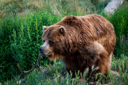

In [7]:
im = Image.open(dest)
im.to_thumb(128,128)

In [8]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')


In [9]:
if not path.exists():
  path.mkdir()
  for o in bear_types:
    dest = (path/o)
    dest.mkdir(exist_ok = True)
    results = search_images_ddg(f'{o} bear')
    download_images(dest,urls=results)

In [10]:
fn = get_image_files(path)
fn

(#563) [Path('bears/grizzly/6a550246-7f09-42d4-a61a-ebb71509ae7d.jpg'),Path('bears/grizzly/de44eebe-0db9-4127-a695-913762369dc1.jpg'),Path('bears/grizzly/b3b74ecd-5a36-4514-8193-0a24d957ac9a.jpg'),Path('bears/grizzly/2148edc8-be1d-41e3-b640-c85863be7a24.jpg'),Path('bears/grizzly/eda5e5c6-bfd1-432d-baa6-ae117c36a219.jpg'),Path('bears/grizzly/de42fc78-5797-4094-8481-718a602ef04d.jpg'),Path('bears/grizzly/eecb756f-837a-4208-8e21-12cc81781254.jpg'),Path('bears/grizzly/dfb7a070-3581-4688-8437-a47125c2c97d.jpg'),Path('bears/grizzly/87ea5e61-57da-45c5-b1a2-acb5822da6bd.jpg'),Path('bears/grizzly/90f5d8c3-f80b-4dac-aa90-4b78fb96af97.jpg')...]

In [11]:
failed = verify_images(fn)
failed


(#25) [Path('bears/grizzly/173aca4f-8456-4efc-90d9-38a4186f8e7c.jpg'),Path('bears/grizzly/bd3fafc8-f105-4868-b1ad-c50eb330e01a.jpg'),Path('bears/grizzly/83da0681-7d51-4c5c-a11a-be17f1da5405.jpg'),Path('bears/grizzly/4cc670da-96d3-4f2d-8b5d-c69726479544.jpeg'),Path('bears/black/db77ae96-27d4-46b1-bc77-b65b015e12c5.jpg'),Path('bears/black/1ba3c8ab-f2cc-4450-b253-024e5ab7ff07.jpg'),Path('bears/black/ba3ce2ad-74b4-4457-b79d-ef64ad192a14.jpg'),Path('bears/black/979afc60-8d9e-40cc-9a2e-d322867421be.jpg'),Path('bears/black/f5a98221-f5d4-4ac8-90ee-7b8d6fdfe3e5.jpg'),Path('bears/teddy/d9f52c0e-4da9-4527-856a-1c7e241a8700.jpg')...]

In [12]:
failed.map(Path.unlink)

(#25) [None,None,None,None,None,None,None,None,None,None...]

In [13]:
??verify_images

In [38]:
bears = DataBlock(
    blocks=(ImageBlock,CategoryBlock),
    get_items= get_image_files,
    splitter = RandomSplitter(valid_pct=0.2,seed=42),
    get_y = parent_label,
    item_tfms = Resize(128)
)


In [39]:
dls = bears.dataloaders(path)


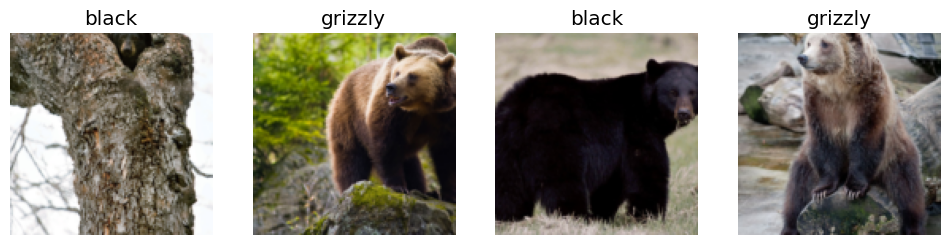

In [16]:
dls.valid.show_batch(max_n=4,nrows=1)

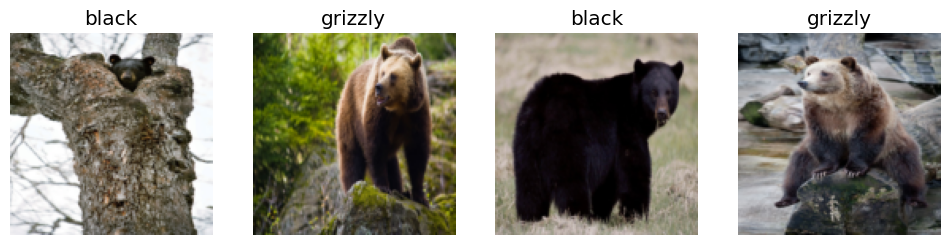

In [17]:
bears = bears.new(item_tfms = Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4,nrows=1)

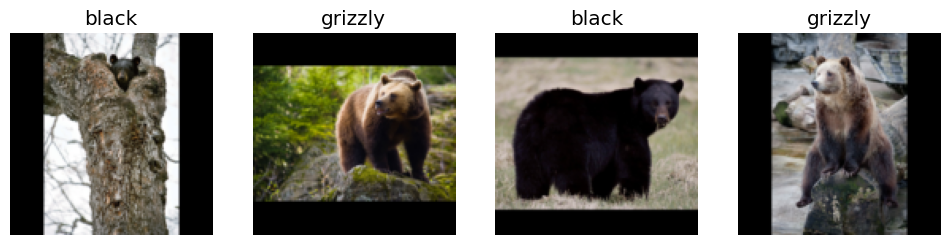

In [18]:
bears = bears.new(item_tfms = Resize(128, ResizeMethod.Pad,pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4,nrows=1)

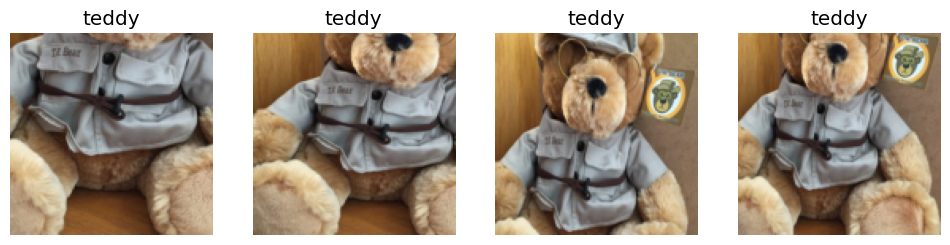

In [19]:
bears = bears.new(item_tfms =RandomResizedCrop((128,128),min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4,nrows=1,unique=True)

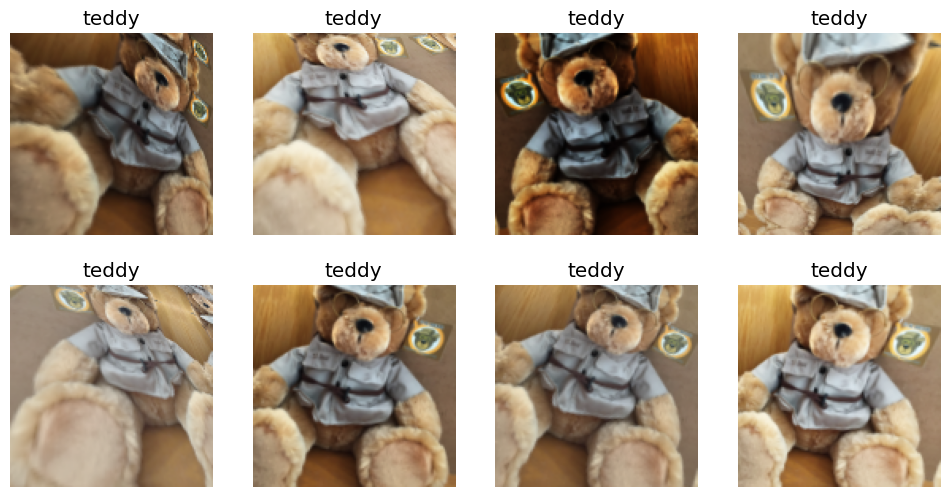

In [20]:
bears = bears.new(item_tfms=Resize(128),batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8,nrows=2,unique=True)

In [40]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224,min_scale=0.5),
    batch_tfms=aug_transforms()
)
dls = bears.dataloaders(path)

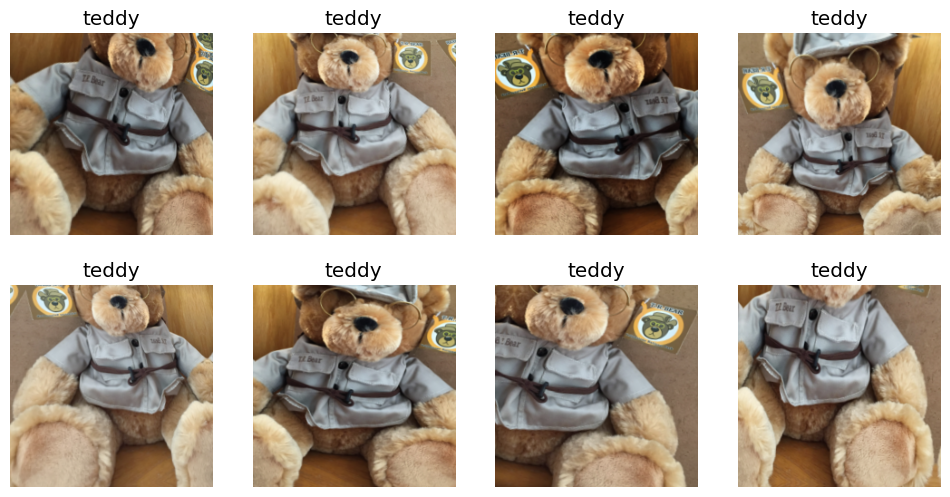

In [41]:
dls.train.show_batch(max_n=8,nrows=2,unique=True)

In [42]:
learn = cnn_learner(dls,resnet18,metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:288: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.816070,0.473071,0.149533,00:28


epoch,train_loss,valid_loss,error_rate,time
0,0.372543,0.252390,0.046729,00:27
1,0.281166,0.243095,0.037383,00:27
2,0.215235,0.242952,0.037383,00:25
3,0.193178,0.234034,0.037383,00:27


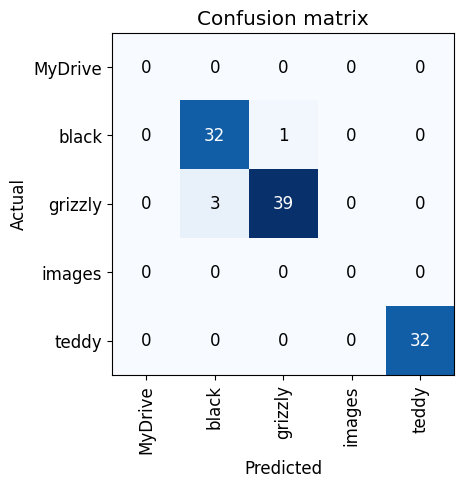

In [43]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

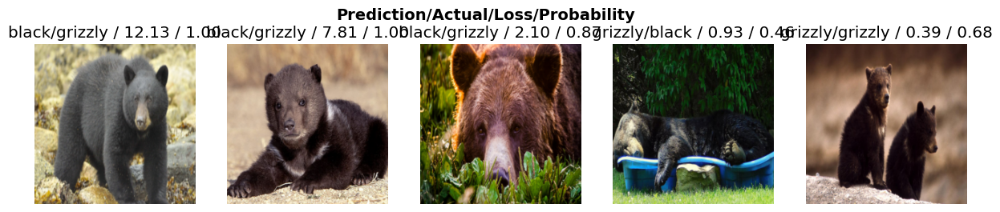

In [44]:
interp.plot_top_losses(5,nrows=1)

In [26]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [37]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]),path/cat)


In [45]:
learn.export()

In [46]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [47]:
learn_inf = load_learner(path/'export.pkl')

In [48]:
learn_inf.predict('images/grizzly.jpeg')

('images',
 tensor(3),
 tensor([8.1789e-03, 2.1647e-02, 2.0415e-01, 7.6588e-01, 1.4411e-04]))

In [49]:
learn_inf.dls.vocab

['MyDrive', 'black', 'grizzly', 'images', 'teddy']

In [50]:
from ipywidgets import widgets
btn_upload = widgets.FileUpload()

In [51]:
btn_upload

FileUpload(value={}, description='Upload')

In [35]:
img = PILImage.create(btn_upload.data[-1])

IndexError: ignored

In [ ]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128))
out_pl

In [ ]:
pred,pred_idx,probs = learn_inf.predict(img)


In [ ]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.4f}'
lbl_pred

In [ ]:
btn_run = widgets.Button(description='Classify')

In [ ]:
VBox([widgets.Label('Select your bear!'),btn_upload, btn_run, out_pl,lbl_pred])

In [ ]:
def on_click_classify(change):
  img = PILImage.create(btn_upload)
  out_pl.clear_output()
  with out_pl: display(img.to_thumb(128))
  pred,pred_idx,probs = learn_inf.predict(img)
  lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.4f}'

btn_run.on_click(on_click_classify)